In [1]:
#!nvidia-smi

In [2]:
%matplotlib notebook

import argparse
import time
import os


In [3]:

import matplotlib.pyplot as plt
from data import NoisyBSDSDataset
from argument import Args
from model import DnCNN, UDnCNN, DUDnCNN, QDUDnCNN
import nntools as nt
from utils import DenoisingStatsManager, plot
from skimage import metrics

import cv2
import numpy as np
import torch


In [4]:

import torch.utils.data as td
import torch.quantization.quantize_fx as quantize_fx
from torch.quantization.fuse_modules import fuse_known_modules
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data as td
import torchvision as tv
from PIL import Image
import model
import inference

In [5]:
def compare_images(imageA, imageB, imageC):
    # compute the mean squared error and structural similarity
    # index for the images
    m0 = metrics.mean_squared_error(imageA, imageA)
    s0 = metrics.structural_similarity(imageA, imageA, multichannel=True)
    print("Image MSE: %.5f, SSIM: %.5f" % (m0, s0))
    m1 = metrics.mean_squared_error(imageA, imageB)
    s1 = metrics.structural_similarity(imageA, imageB, multichannel=True)
    print("Noise MSE: %.5f, SSIM: %.5f" % (m1, s1))
    m2 = metrics.mean_squared_error(imageA, imageC)
    s2 = metrics.structural_similarity(imageA, imageC, multichannel=True)
    print("Denoise MSE: %.5f, SSIM: %.5f" % (m2, s2))

    return m2,s2

In [6]:
class NoisyBSDSDataset(td.Dataset):

    def __init__(self, root_dir, mode='train', image_size=(180, 180), sigma=30):
        super(NoisyBSDSDataset, self).__init__()
        self.mode = mode
        self.image_size = image_size
        self.sigma = sigma
        self.images_dir = os.path.join(root_dir, mode)
        self.files = os.listdir(self.images_dir)

    def __len__(self):
        return len(self.files)

    def __repr__(self):
        return "NoisyBSDSDataset(mode={}, image_size={}, sigma={})". \
            format(self.mode, self.image_size, self.sigma)

    def __getitem__(self, idx):
        img_path = os.path.join(self.images_dir, self.files[idx])
        clean = Image.open(img_path).convert('RGB')   
        # random crop
        i = np.random.randint(clean.size[0] - self.image_size[0])
        j = np.random.randint(clean.size[1] - self.image_size[1])
        
        clean = clean.crop([i, j, i+self.image_size[0], j+self.image_size[1]])
        transform = tv.transforms.Compose([
            # convert it to a tensor
            tv.transforms.ToTensor(),
            # normalize it to the range [−1, 1]
            tv.transforms.Normalize((.5, .5, .5), (.5, .5, .5))
            ])
        clean = transform(clean)
        
        noisy = clean + 2 / 255 * self.sigma * torch.randn(clean.shape)
        return noisy, clean

In [7]:
def myimshow(image, ax=plt):
    image = image.to('cpu').numpy()
    image = np.moveaxis(image, [0, 1, 2], [2, 0, 1])
    image = (image + 1) / 2
    image[image < 0] = 0
    image[image > 1] = 1
    h = ax.imshow(image)
    ax.axis('off')
    return h

In [8]:
def myimret(image, ax=plt):
    image = image.to('cpu').numpy()
    image = np.moveaxis(image, [0, 1, 2], [2, 0, 1])
    image = (image + 1) / 2
    image[image < 0] = 0
    image[image > 1] = 1
#    h = ax.imshow(image)
#    ax.axis('off')
    return image

In [9]:
def img_to_tensor(img, device):
    tensor = torch.FloatTensor(img).to(device)
    tensor = tensor.permute([2, 0, 1]) / 255.
    tensor = (tensor - 0.5) / 0.5

    return tensor.unsqueeze(0)

In [10]:
def tensor_to_img(tensor):
    tensor = tensor[0].permute([1, 2, 0])
    tensor = (tensor * 0.5 + 0.5) * 255
    tensor = tensor.clamp(0, 255)
    return tensor.cpu().numpy().astype(np.uint8)

In [11]:
def quantize_model(quantize_type, model, input_example=None, qat_state=None):
    if quantize_type == 'dynamic':
        model = torch.quantization.quantize_dynamic(
            model,
            {torch.nn.Conv2d},
            dtype=torch.qint8
        )
    elif quantize_type == 'static':
        model.qconfig = torch.quantization.get_default_qconfig('fbgemm')
        for i in range(len(model.bn)):
            conv, bn = model.conv[i+1], model.bn[i]
            conv_new, bn_new = fuse_known_modules([conv, bn])
            setattr(model.conv, str(i+1), conv_new)
            setattr(model.bn, str(i), bn_new)
        model_fp32_fused = model
        model_fp32_prepared = torch.quantization.prepare(model_fp32_fused)
        if input_example is not None:
            model_fp32_prepared(input_example)
        model = torch.quantization.convert(model_fp32_prepared)
    elif quantize_type == 'fx_dynamic':
        qconfig_dict = {"": torch.quantization.default_dynamic_qconfig}
        # prepare
        model_prepared = quantize_fx.prepare_fx(model, qconfig_dict)
        # no calibration needed when we only have dynamici/weight_only quantization
        # quantize
        model = quantize_fx.convert_fx(model_prepared)
    elif quantize_type == 'fx_static':
        #qconfig_dict = {"": torch.quantization.get_default_qconfig('qnnpack')}
        qconfig_dict = {"": torch.quantization.get_default_qconfig('fbgemm')}
        # prepare
        model_prepared = quantize_fx.prepare_fx(model, qconfig_dict)
        # calibrate (not shown)
        if input_example is not None:
            model_prepared(input_example)
        # quantize
        model = quantize_fx.convert_fx(model_prepared)
        if qat_state is not None:
            model.load_state_dict(qat_state)

    return model

In [12]:
def main(img_set,model_path,qat=False,quantize='none'):
    args = Args()
    args.quantize = quantize
    device = 'cpu'
    if qat:
        denoise, qat_state = inference.load_model(model_path, QDUDnCNN, args.D, args.C, device=device)
    else:
        denoise, qat_state = inference.load_model(model_path, DUDnCNN, args.D, args.C, device=device)

    img = []
    titles = ['clean', 'noise', 'denoise']
    x, clean = img_set
    x = x.unsqueeze(0).to(device)
    img.append(clean)
    img.append(x[0])

    if args.quantize:
        print('Quantize model...'+quantize)
        denoise = quantize_model(args.quantize, denoise, input_example=x, qat_state=qat_state)

    t = time.time()
    with torch.no_grad():
        y = denoise(x)
    img.append(y[0])

    print(f'Elapsed: {(time.time() - t) * 1000:.2f}ms')
    print(f'Image size is {x[0].shape}.')
    y1 = myimret(img[0])
    y2 = myimret(img[1])
    y3 = myimret(img[2])
    compare_images(y1,y2,y3)
    

    fig, axes = plt.subplots(ncols=3, figsize=(9,5), sharex='all', sharey='all')
    for i in range(len(img)):
        myimshow(img[i], ax=axes[i])
        axes[i].set_title(f'{titles[i]}')



In [13]:

def eval_q(img_set,model_path,qat=False,quantize='none',display=False): 
    args = Args()
    args.quantize = quantize
    device = 'cpu'
    if qat:
        denoise, qat_state = inference.load_model(model_path, QDUDnCNN, args.D, args.C, device=device)
    else:
        denoise, qat_state = inference.load_model(model_path, DUDnCNN, args.D, args.C, device=device)
    
    img = []
    titles = ['clean', 'noise', 'denoise'] 
    x, clean = img_set
    x = x.unsqueeze(0).to(device)
    
#    if display:
    img.append(clean)
    img.append(x[0])

    if args.quantize:
        denoise = quantize_model(args.quantize, denoise, input_example=x, qat_state=qat_state)

    t = time.time()
    with torch.no_grad():
        y = denoise(x) 
    img.append(y[0])
#    print(f'Elapsed: {(time.time() - t) * 1000:.2f}ms')
    y1 = myimret(img[0])
    y2 = myimret(img[1])
    y3 = myimret(img[2])
    compare_images(y1,y2,y3)

    if display:
        fig, axes = plt.subplots(ncols=3, figsize=(9,5), sharex='all', sharey='all')
        for i in range(len(img)):
            myimshow(img[i], ax=axes[i])
            axes[i].set_title(f'{titles[i]}') 
    return (time.time() - t) * 1000, quantize

In [14]:
dataset_root_dir = os.environ.get('DATA_DIR')+'/images'
test_set = NoisyBSDSDataset(dataset_root_dir, mode='test', image_size=(320, 320))

In [15]:
path = os.environ.get('TRAINING_DIR')+'/no_qat/checkpoint.pth'
args = Args()
denoise = inference.load_model(path,model.QDUDnCNN,args.D,args.C,device='cpu')

In [16]:
img_set = test_set[1]

In [17]:
path = os.environ.get('TRAINING_DIR')+'/no_qat/checkpoint.pth' 
print('==>Non-Quantization Aware Trained Model')
eval_time,q = eval_q(img_set, path, False,'none', False) 
print(f'++>Qntization - {q}: {eval_time:.2f}ms')
#eval_time,q = eval_q(img_set, path, False,'static', False) 
#print(f'Qntization - {q}: {eval_time:.2f}ms') 
eval_time,q = eval_q(img_set, path, False,'dynamic', False) 
print(f'++>Qntization - {q}: {eval_time:.2f}ms') 
eval_time,q = eval_q(img_set, path, False,'fx_static', False) 
print(f'++>Qntization - {q}: {eval_time:.2f}ms') 
eval_time,q = eval_q(img_set, path,False, 'fx_dynamic', False) 
print(f'Qntization - {q}: {eval_time:.2f}ms')

==>Non-Quantization Aware Trained Model
Image MSE: 0.00000, SSIM: 1.00000
Noise MSE: 0.01254, SSIM: 0.43959
Denoise MSE: 0.00170, SSIM: 0.85051
++>Qntization - none: 5972.90ms
Image MSE: 0.00000, SSIM: 1.00000
Noise MSE: 0.01254, SSIM: 0.43959
Denoise MSE: 0.00170, SSIM: 0.85051
++>Qntization - dynamic: 5548.57ms


/usr/local/lib/python3.6/dist-packages/torch/quantization/observer.py:124: UserWarning: Please use quant_min and quant_max to specify the range for observers.                     reduce_range will be deprecated in a future release of PyTorch.
  reduce_range will be deprecated in a future release of PyTorch."
/usr/local/lib/python3.6/dist-packages/torch/_tensor.py:575: UserWarning: floor_divide is deprecated, and will be removed in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values.
To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor'). (Triggered internally at  /pytorch/aten/src/ATen/native/BinaryOps.cpp:467.)
  return torch.floor_divide(self, other)


Image MSE: 0.00000, SSIM: 1.00000
Noise MSE: 0.01254, SSIM: 0.43959
Denoise MSE: 0.00172, SSIM: 0.84855
++>Qntization - fx_static: 3728.84ms


/usr/local/lib/python3.6/dist-packages/torch/quantization/fx/quantization_patterns.py:444: UserWarning: dtype combination: (torch.float32, torch.qint8, torch.quint8) is not supported by Conv supported dtype combinations are: [(torch.quint8, torch.qint8, None)]
  "supported dtype combinations are: {}".format(dtypes, supported_dtypes))


Image MSE: 0.00000, SSIM: 1.00000
Noise MSE: 0.01254, SSIM: 0.43959
Denoise MSE: 0.00170, SSIM: 0.85051
Qntization - fx_dynamic: 5185.62ms


path = os.environ.get('TRAINING_DIR')+'/qat/checkpoint.pth' 
print('==>Quantization Aware Trained Model')
eval_time,q = eval_q(img_set, path,True, 'none', False) 
print(f'++>Qntization - {q}: {eval_time:.2f}ms')
eval_time,q = eval_q(img_set, path,True, 'static', False) 
print(f'++>Qntization - {q}: {eval_time:.2f}ms') 
eval_time,q = eval_q(img_set, path,True, 'dynamic', False) 
print(f'++>Qntization - {q}: {eval_time:.2f}ms') 
eval_time,q = eval_q(img_set, path,True, 'fx_static', False) 
print(f'++>Qntization - {q}: {eval_time:.2f}ms') 
eval_time,q = eval_q(img_set, path,True, 'fx_dynamic', False) 
print(f'++>Qntization - {q}: {eval_time:.2f}ms')

In [19]:
path = os.environ.get('TRAINING_DIR')+'/qat_fx_static/checkpoint.pth' 
print('==>Quantization Aware fx_static Trained Model')
eval_time,q = eval_q(img_set, path, True,'none', False) 
print(f'++>Qntization - {q}: {eval_time:.2f}ms')
eval_time,q = eval_q(img_set, path, True,'static', False) 
print(f'++>Qntization - {q}: {eval_time:.2f}ms') 
eval_time,q = eval_q(img_set, path, True,'dynamic', False) 
print(f'++>Qntization - {q}: {eval_time:.2f}ms') 
eval_time,q = eval_q(img_set, path, True,'fx_static', False) 
print(f'++>Qntization - {q}: {eval_time:.2f}ms') 
eval_time,q = eval_q(img_set, path, True,'fx_dynamic', False) 
print(f'++>Qntization - {q}: {eval_time:.2f}ms')

==>Quantization Aware fx_static Trained Model
Image MSE: 0.00000, SSIM: 1.00000
Noise MSE: 0.01254, SSIM: 0.43959
Denoise MSE: 0.13847, SSIM: 0.26797
++>Qntization - none: 5378.94ms
Image MSE: 0.00000, SSIM: 1.00000
Noise MSE: 0.01254, SSIM: 0.43959
Denoise MSE: 0.07551, SSIM: 0.30124
++>Qntization - static: 3950.50ms
Image MSE: 0.00000, SSIM: 1.00000
Noise MSE: 0.01254, SSIM: 0.43959
Denoise MSE: 0.16855, SSIM: 0.17026
++>Qntization - dynamic: 5267.33ms
Image MSE: 0.00000, SSIM: 1.00000
Noise MSE: 0.01254, SSIM: 0.43959
Denoise MSE: 0.00459, SSIM: 0.64764
++>Qntization - fx_static: 3419.19ms
Image MSE: 0.00000, SSIM: 1.00000
Noise MSE: 0.01254, SSIM: 0.43959
Denoise MSE: 0.08371, SSIM: 0.32099
++>Qntization - fx_dynamic: 4973.98ms


In [20]:
img_set = test_set[1]
path = os.environ.get('TRAINING_DIR')+'/no_qat/checkpoint.pth'
print("No QAT")

No QAT


Quantize model...none
Elapsed: 5299.31ms
Image size is torch.Size([3, 320, 320]).
Image MSE: 0.00000, SSIM: 1.00000
Noise MSE: 0.01203, SSIM: 0.45906
Denoise MSE: 0.00168, SSIM: 0.85751


<IPython.core.display.Javascript object>


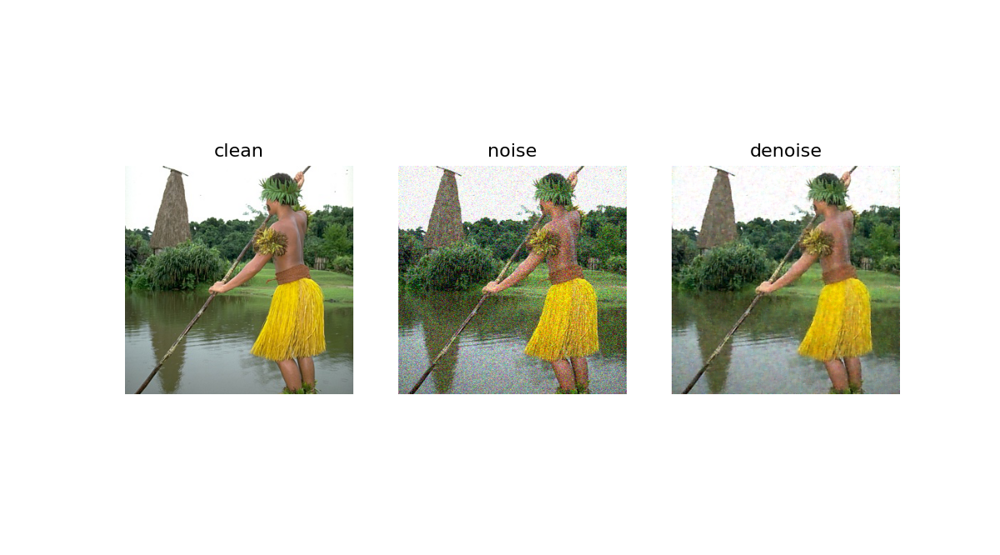

In [21]:
main(img_set,path,False,'none')

In [22]:
#main(img_set,path,False,'static')

Quantize model...dynamic
Elapsed: 4795.55ms
Image size is torch.Size([3, 320, 320]).
Image MSE: 0.00000, SSIM: 1.00000
Noise MSE: 0.01203, SSIM: 0.45906
Denoise MSE: 0.00168, SSIM: 0.85751


<IPython.core.display.Javascript object>


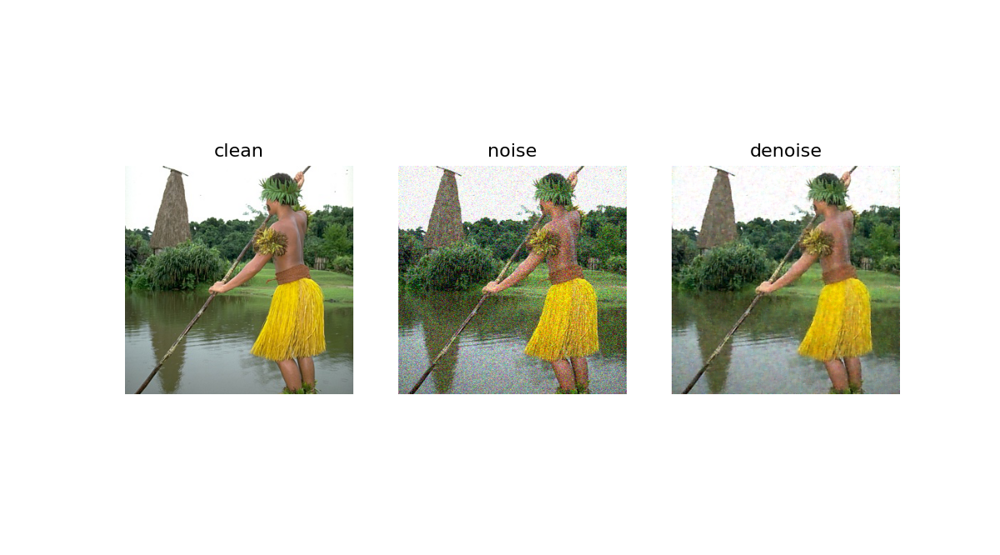

In [23]:
main(img_set,path,False,'dynamic')

Quantize model...fx_static
Elapsed: 3478.42ms
Image size is torch.Size([3, 320, 320]).
Image MSE: 0.00000, SSIM: 1.00000
Noise MSE: 0.01203, SSIM: 0.45906
Denoise MSE: 0.00170, SSIM: 0.85565


<IPython.core.display.Javascript object>


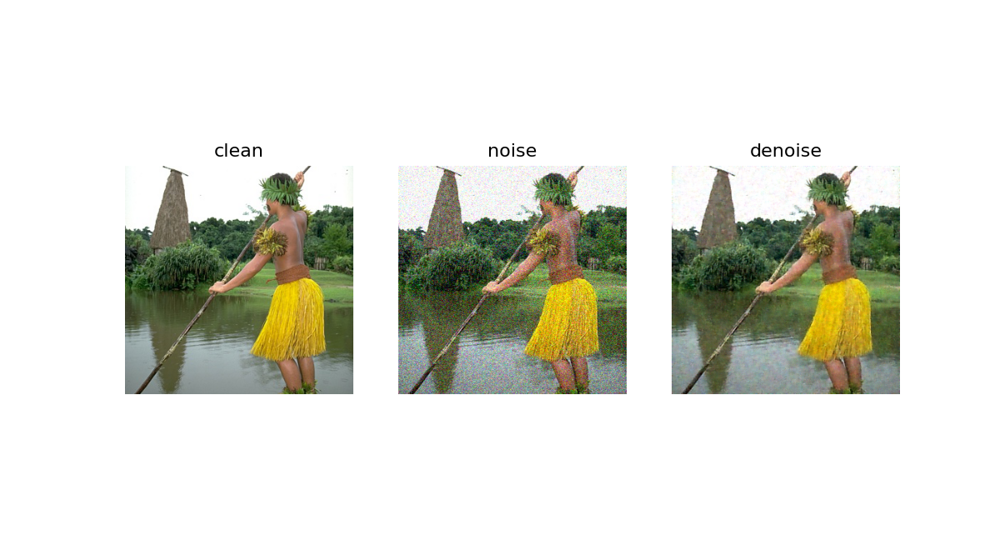

In [24]:
main(img_set,path,False,'fx_static')

Quantize model...fx_dynamic
Elapsed: 4479.89ms
Image size is torch.Size([3, 320, 320]).
Image MSE: 0.00000, SSIM: 1.00000
Noise MSE: 0.01203, SSIM: 0.45906
Denoise MSE: 0.00168, SSIM: 0.85751


<IPython.core.display.Javascript object>


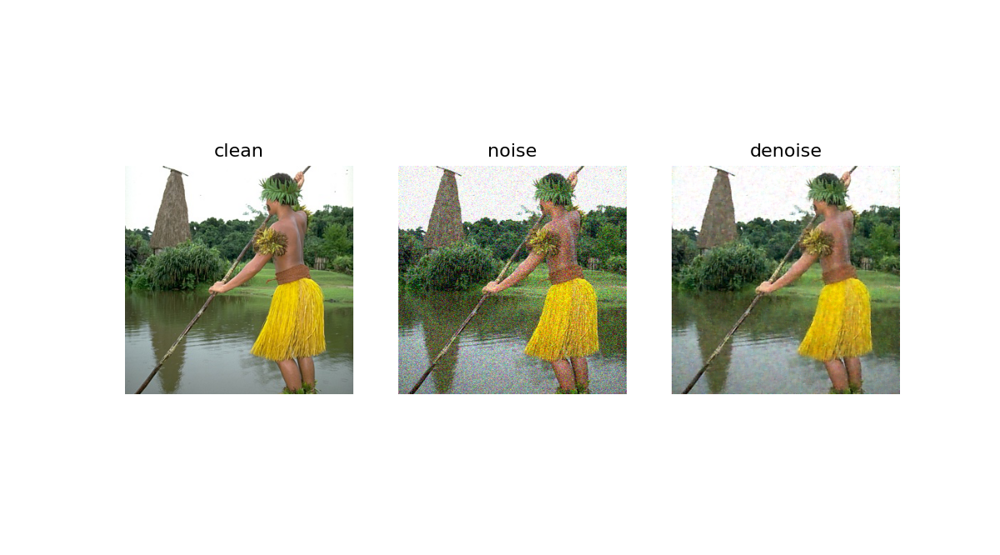

In [25]:
main(img_set,path,False,'fx_dynamic')

In [26]:
img_set = test_set[1]
path = os.environ.get('TRAINING_DIR')+'/qat/checkpoint.pth'
print('QAT')

QAT


Quantize model...none
Elapsed: 5500.38ms
Image size is torch.Size([3, 320, 320]).
Image MSE: 0.00000, SSIM: 1.00000
Noise MSE: 0.01030, SSIM: 0.48154
Denoise MSE: 0.00122, SSIM: 0.90205


<IPython.core.display.Javascript object>


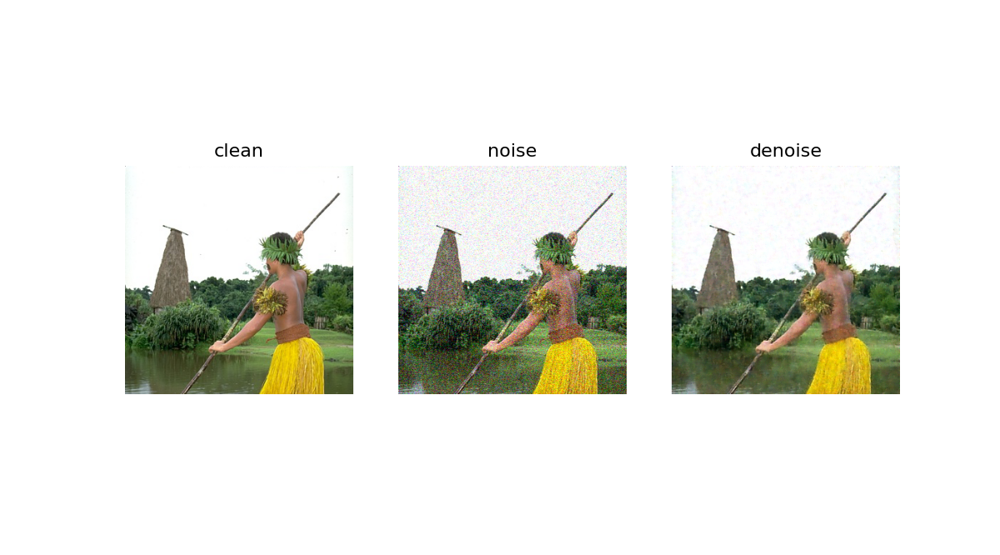

In [27]:
main(img_set,path,True,'none')

Quantize model...static
Elapsed: 3887.22ms
Image size is torch.Size([3, 320, 320]).
Image MSE: 0.00000, SSIM: 1.00000
Noise MSE: 0.01030, SSIM: 0.48154
Denoise MSE: 0.00124, SSIM: 0.89987


<IPython.core.display.Javascript object>


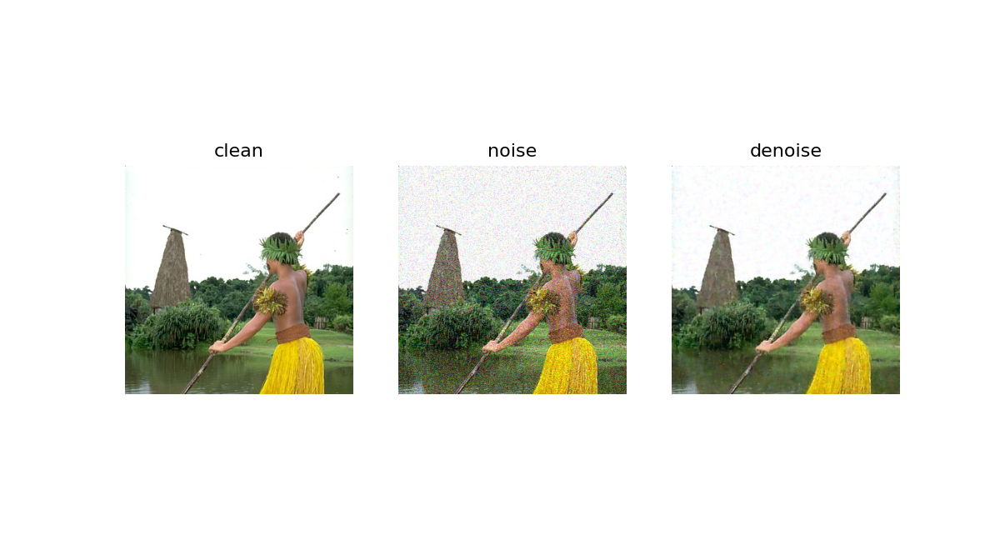

In [28]:
main(img_set,path,True,'static')

Quantize model...dynamic
Elapsed: 4698.30ms
Image size is torch.Size([3, 320, 320]).
Image MSE: 0.00000, SSIM: 1.00000
Noise MSE: 0.01030, SSIM: 0.48154
Denoise MSE: 0.00122, SSIM: 0.90205


<IPython.core.display.Javascript object>


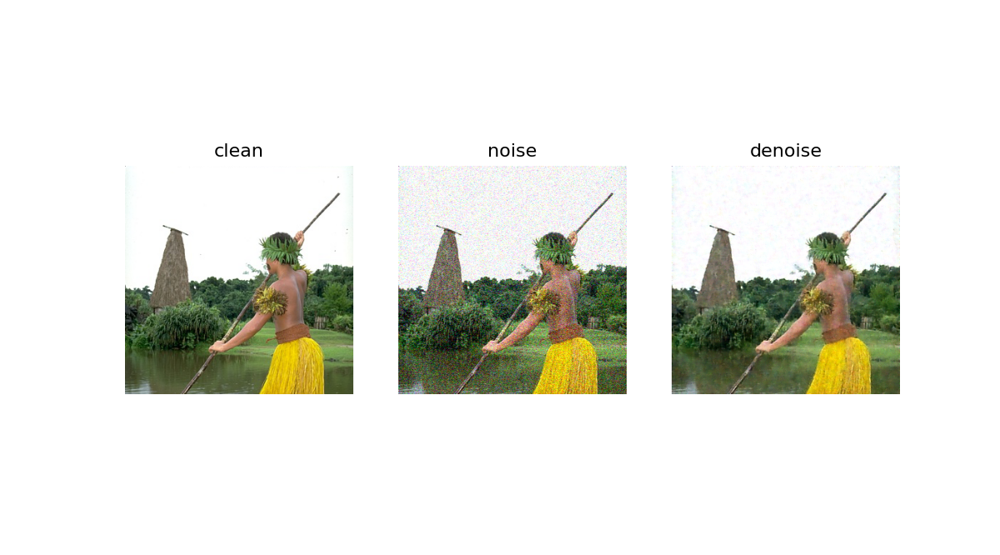

In [29]:
main(img_set,path,True,'dynamic')

Quantize model...fx_static
Elapsed: 3197.84ms
Image size is torch.Size([3, 320, 320]).
Image MSE: 0.00000, SSIM: 1.00000
Noise MSE: 0.01030, SSIM: 0.48154
Denoise MSE: 0.00124, SSIM: 0.90052


<IPython.core.display.Javascript object>


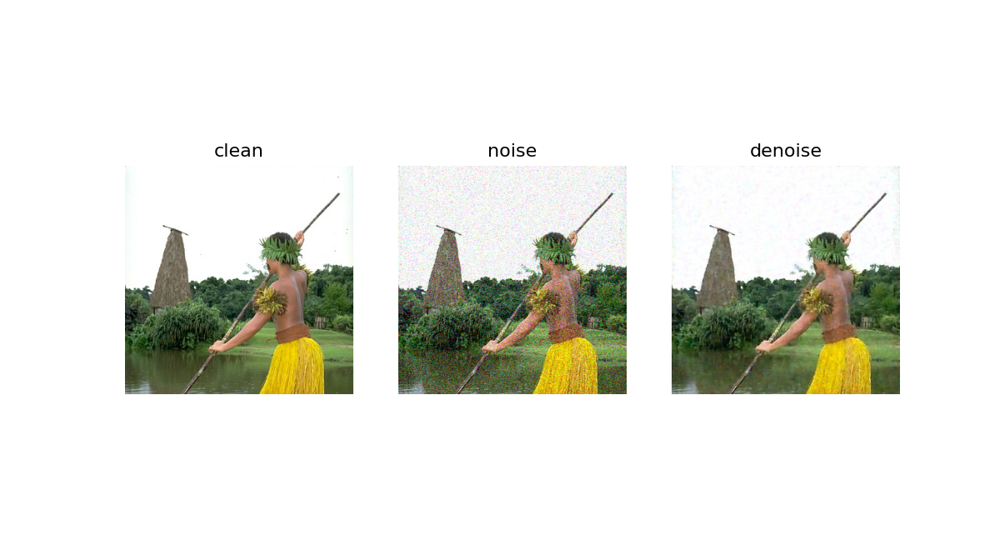

In [30]:
main(img_set,path,True,'fx_static')

Quantize model...fx_dynamic
Elapsed: 4482.53ms
Image size is torch.Size([3, 320, 320]).
Image MSE: 0.00000, SSIM: 1.00000
Noise MSE: 0.01030, SSIM: 0.48154
Denoise MSE: 0.00122, SSIM: 0.90205


<IPython.core.display.Javascript object>


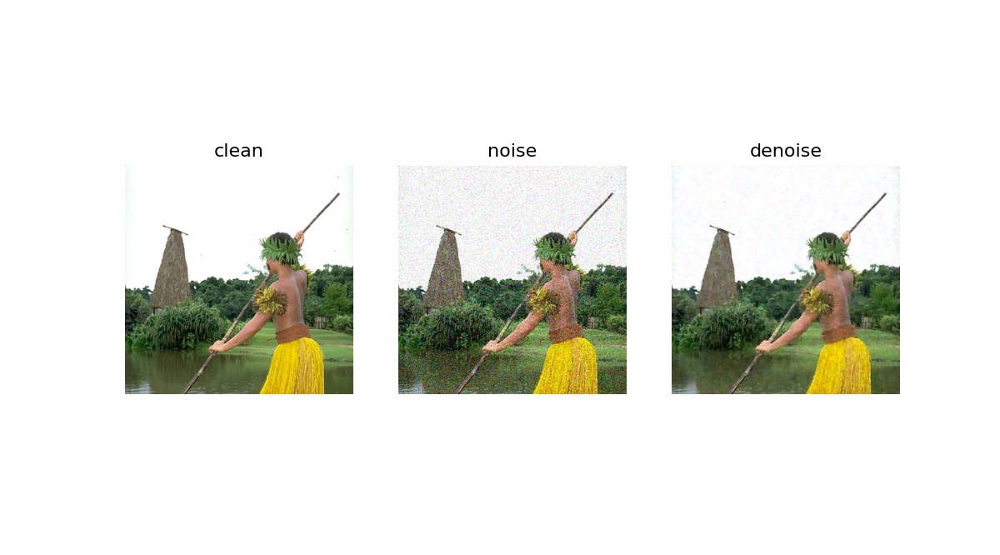

In [31]:
main(img_set,path,True,'fx_dynamic')

In [32]:
img_set = test_set[1]
path = os.environ.get('TRAINING_DIR')+'/qat_fx_static/checkpoint.pth'
print('QAT_FX_STATIC')

QAT_FX_STATIC


Quantize model...none
Elapsed: 5256.94ms
Image size is torch.Size([3, 320, 320]).
Image MSE: 0.00000, SSIM: 1.00000
Noise MSE: 0.01157, SSIM: 0.46975
Denoise MSE: 0.13914, SSIM: 0.17293


<IPython.core.display.Javascript object>


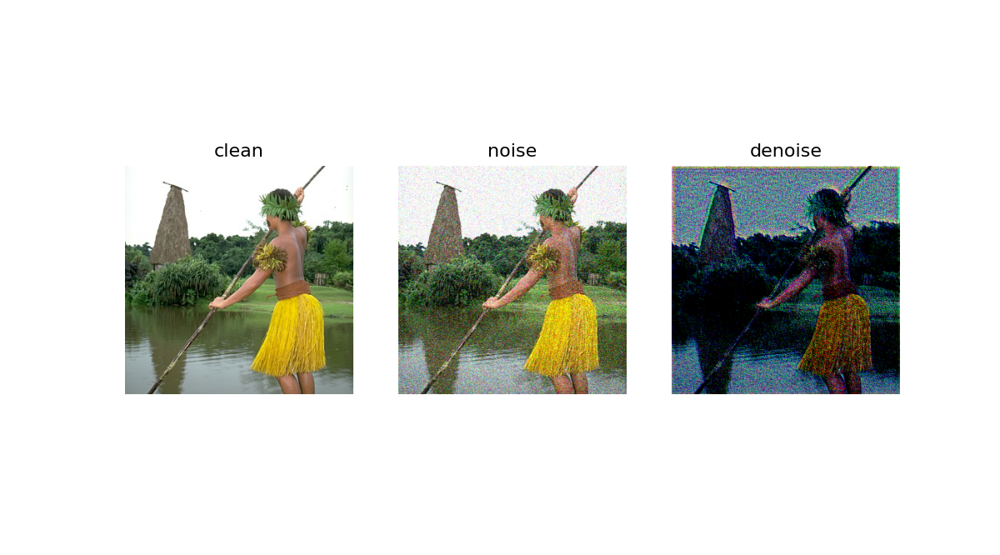

In [33]:
main(img_set,path,True,'none')

Quantize model...static
Elapsed: 3598.44ms
Image size is torch.Size([3, 320, 320]).
Image MSE: 0.00000, SSIM: 1.00000
Noise MSE: 0.01157, SSIM: 0.46975
Denoise MSE: 0.03136, SSIM: 0.36501


<IPython.core.display.Javascript object>


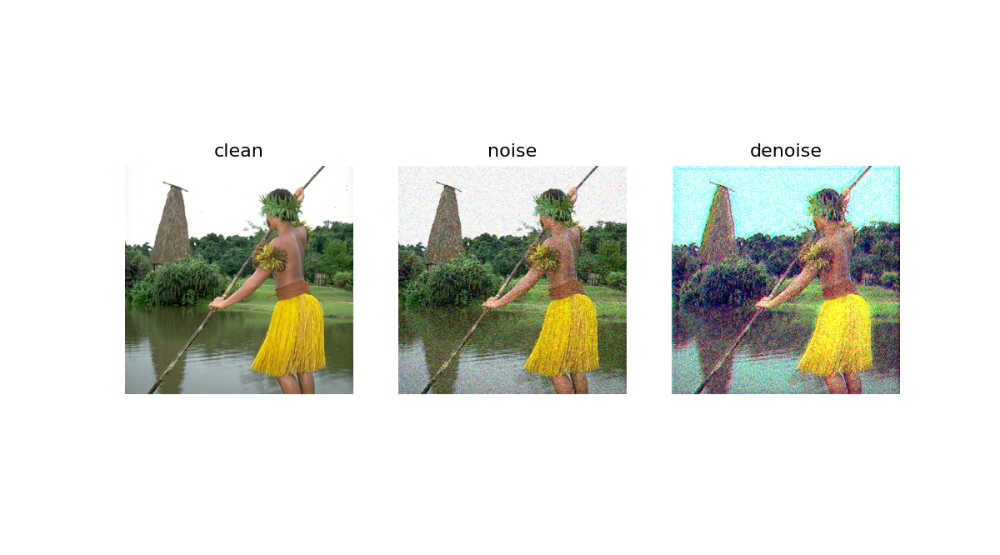

In [34]:
main(img_set,path,True,'static')

Quantize model...dynamic
Elapsed: 4898.72ms
Image size is torch.Size([3, 320, 320]).
Image MSE: 0.00000, SSIM: 1.00000
Noise MSE: 0.01157, SSIM: 0.46975
Denoise MSE: 0.19312, SSIM: 0.32852


<IPython.core.display.Javascript object>


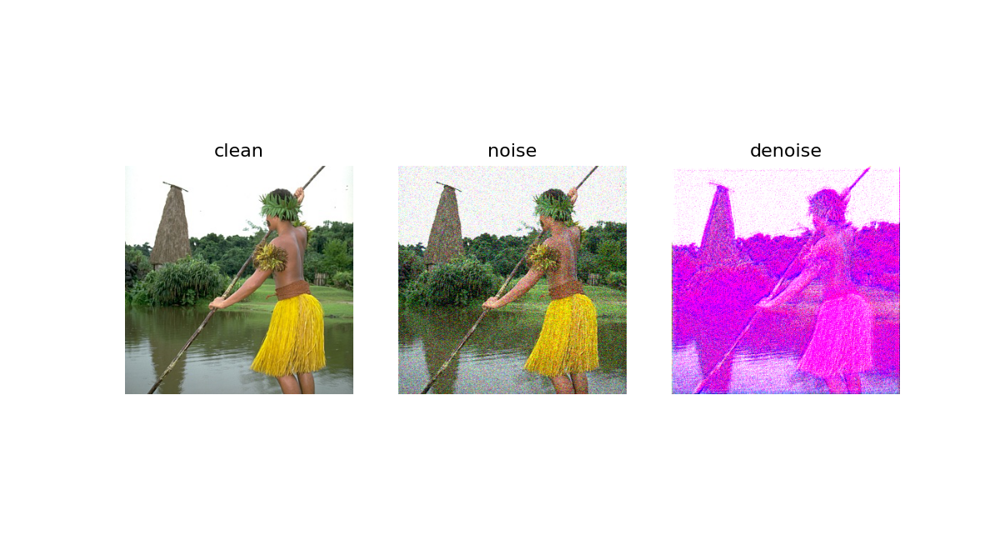

In [35]:
main(img_set,path,True,'dynamic')

Quantize model...fx_static
Elapsed: 3266.72ms
Image size is torch.Size([3, 320, 320]).
Image MSE: 0.00000, SSIM: 1.00000
Noise MSE: 0.01157, SSIM: 0.46975
Denoise MSE: 0.00443, SSIM: 0.67089


<IPython.core.display.Javascript object>


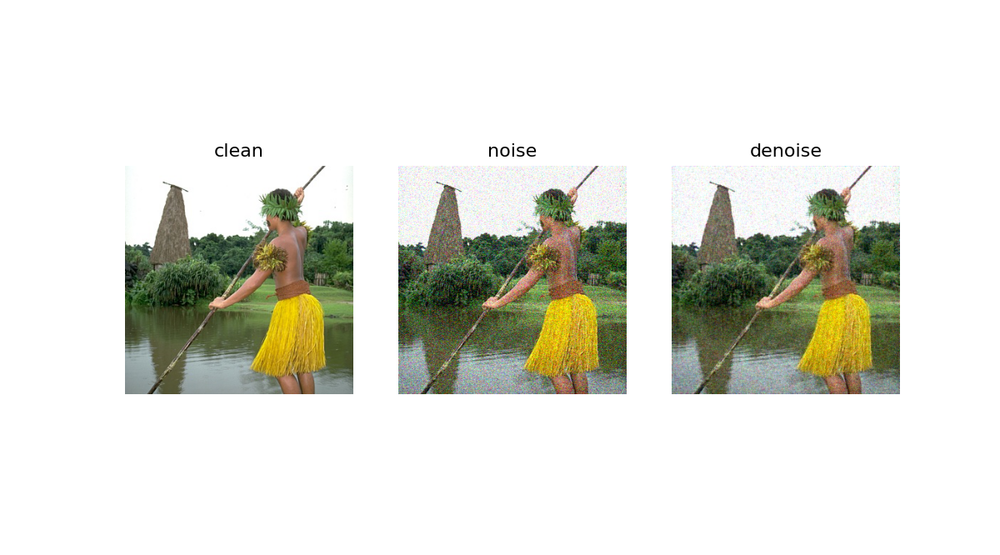

In [36]:
main(img_set,path,True,'fx_static')

Quantize model...fx_dynamic
Elapsed: 4377.37ms
Image size is torch.Size([3, 320, 320]).
Image MSE: 0.00000, SSIM: 1.00000
Noise MSE: 0.01157, SSIM: 0.46975
Denoise MSE: 0.15606, SSIM: 0.32704


<IPython.core.display.Javascript object>


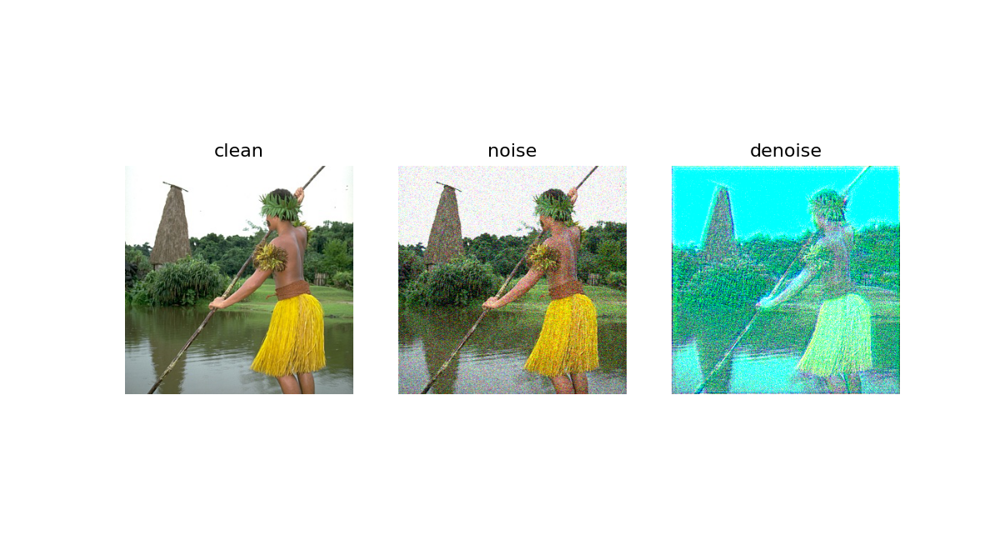

In [37]:
main(img_set,path,True,'fx_dynamic')

In [38]:
path = os.environ.get('TRAINING_DIR')+'/qat_fx_static/checkpoint.pth' 